In [187]:
# Import Libraries
from PIL import Image
import cv2
from plantcv import plantcv as pcv
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


import matplotlib as mpl
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
# from colorspacious import cspace_converter
from collections import OrderedDict

cmaps = OrderedDict()

In [188]:
def display(img,cmap=None):
    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap=cmap)

In [189]:
class options:
    def __init__(self):
        self.image = "/Users/garethtate/plantcv/TestImagesRPi/Still-1-RGB-2021-07-09_12-15-55.jpg"
        self.debug = "plot"
        self.writeimg= False 
        self.result = "ROINDVI_test_results.json"
        self.outdir = "/Users/garethtate/plantcv" # Store the output to the current directory

# Get options
args = options()

# Set debug to the global parameter 
pcv.params.debug = args.debug

In [190]:
def undistort(image, camera_matrix, distortion_coefficients):
    """ Using a given calibration matrix, display the distorted, undistorted, and cropped frame"""
    scaled_camera_matrix, roi = cv2.getOptimalNewCameraMatrix(
        camera_matrix, distortion_coefficients, (image.shape[1],image.shape[0]), 1, (image.shape[1],image.shape[0]))

#     distorted_frame = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    distorted_frame = image
    undistorted_frame = cv2.undistort(
            image, camera_matrix, distortion_coefficients, None, scaled_camera_matrix,
    )
    roi_x, roi_y, roi_w, roi_h = roi
    cropped_frame = undistorted_frame[roi_y : roi_y + roi_h, roi_x : roi_x + roi_w]
    
    return cropped_frame, undistorted_frame, distorted_frame

In [191]:
camera_matrix = np.loadtxt("/Users/garethtate/Downloads/rgb_cam/cameraMatrix.txt", dtype='float', delimiter=',')
print(camera_matrix)

[[804.46398649   0.         524.45666786]
 [  0.         806.13379766 398.08979754]
 [  0.           0.           1.        ]]


In [192]:
distortion_coefficients = np.loadtxt("/Users/garethtate/Downloads/rgb_cam/cameraDistortion.txt", dtype='float', delimiter=',')
print(distortion_coefficients)

[ 9.21684288e-02  6.03056968e-01  5.52094744e-04  5.68822700e-03
 -2.62068748e+00]


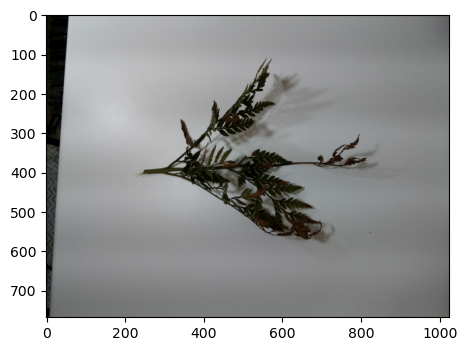

In [193]:
# Read image 

# Inputs:
#   filename - Image file to be read in 
#   mode - Return mode of image; either 'native' (default), 'rgb', 'gray', or 'csv' 
img, path, filename = pcv.readimage(filename=args.image)


In [194]:
img.shape

(768, 1024, 3)

In [195]:
cropped, undis, dis = undistort(img, camera_matrix, distortion_coefficients)

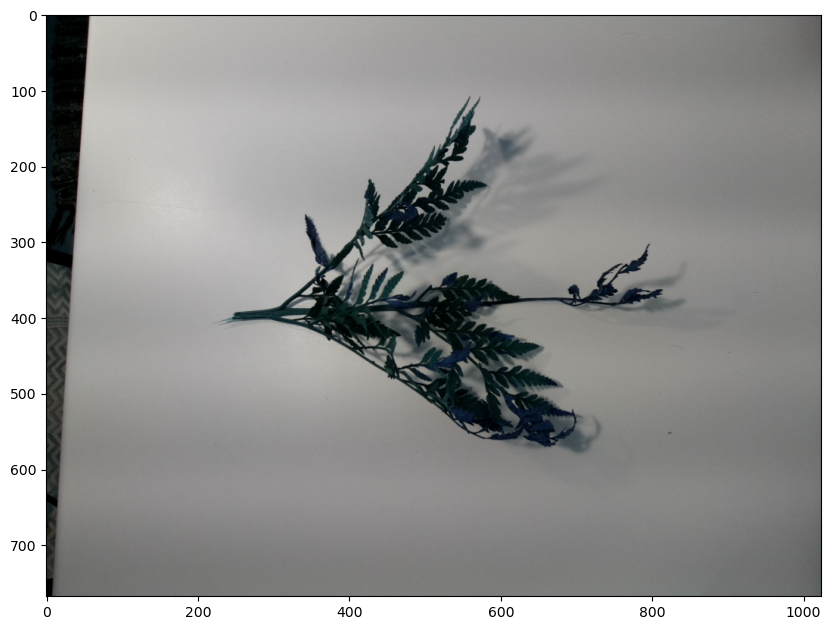

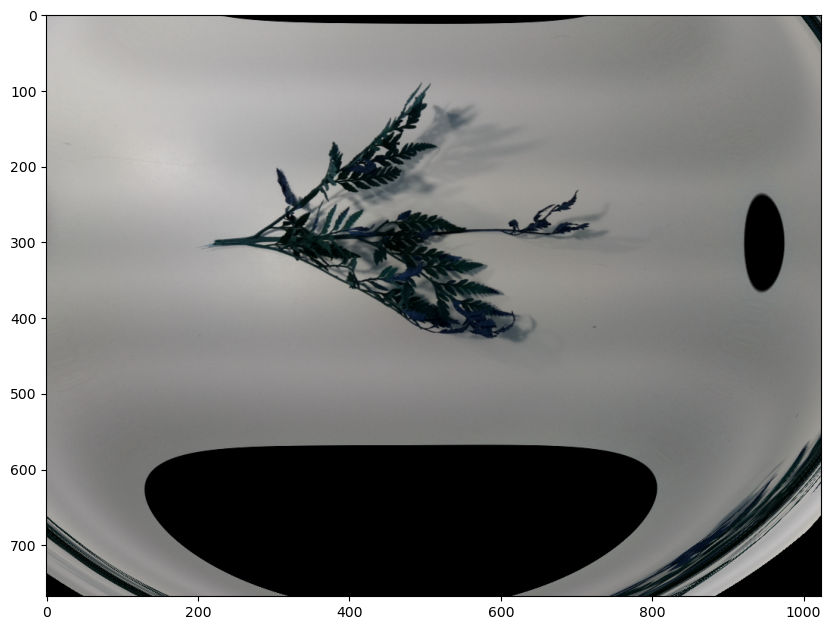

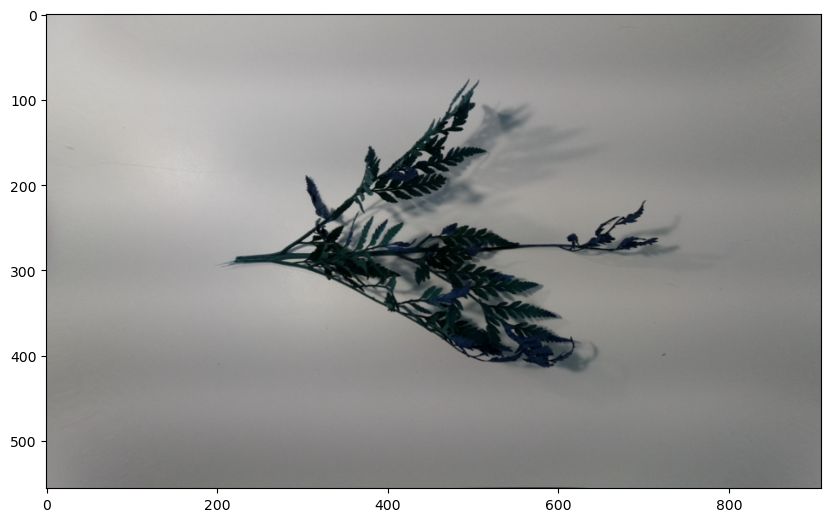

In [196]:
display(dis)
display(undis)
display(cropped)

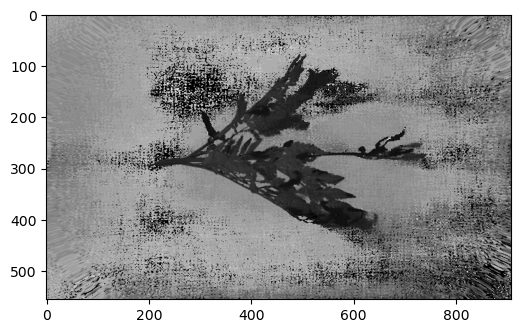

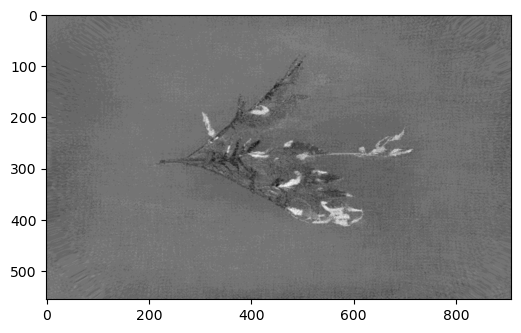

In [197]:
h_channel = pcv.rgb2gray_hsv(rgb_img=cropped, channel='h')
a_channel = pcv.rgb2gray_lab(rgb_img=cropped, channel='a')

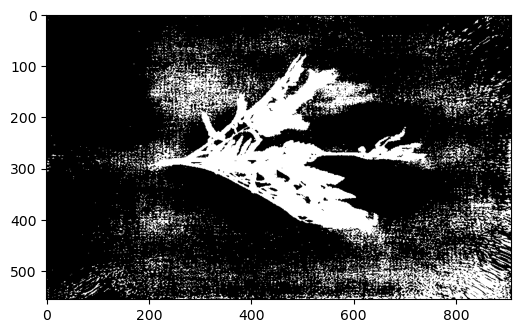

In [198]:
threshold_light_a = pcv.threshold.otsu(gray_img=h_channel, max_value=255, object_type='dark')
# threshold_light_h = pcv.threshold.otsu(gray_img=h_channel, max_value=255, object_type='dark')

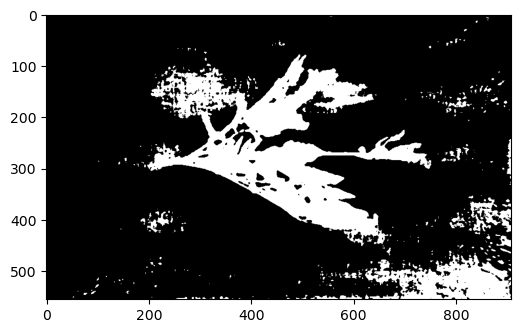

In [199]:
binary_img = pcv.median_blur(gray_img=threshold_light_a, ksize=5)

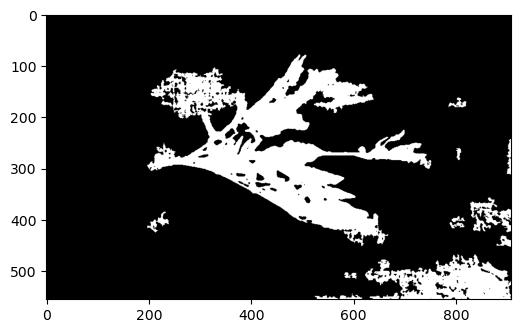

In [200]:
# Fill in small objects (speckles)

# Inputs:
#    bin_img  = binary image. img will be returned after filling
#    size     = minimum object area size in pixels (integer)
fill_image = pcv.fill(bin_img=binary_img, size=100)
#                                                ^
#                                                |
#                                 adjust this value

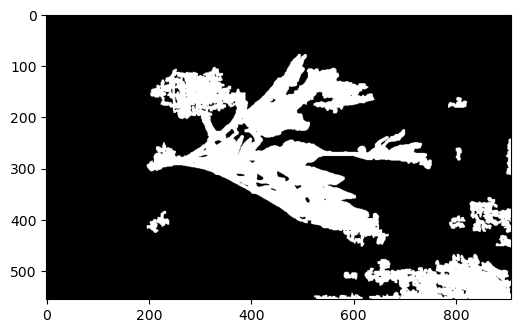

In [201]:
# Dilate so that you don't lose leaves (just in case)

# Inputs:
#    gray_img = input image
#    ksize    = integer, kernel size
#    i        = iterations, i.e. number of consecutive filtering passes
dilated = pcv.dilate(gray_img=fill_image, ksize=3, i=1)

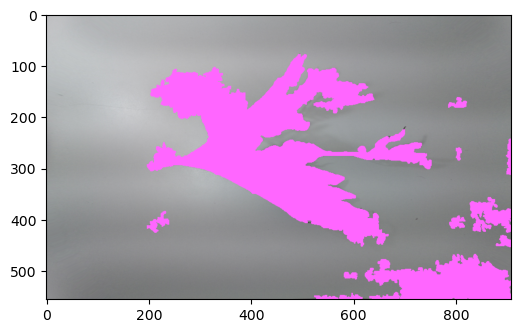

In [202]:
# Find objects (contours: black-white boundaries)

# Inputs:
#    img  = image that the objects will be overlayed
#    mask = what is used for object detection
id_objects, obj_hierarchy = pcv.find_objects(img=cropped, mask=dilated)

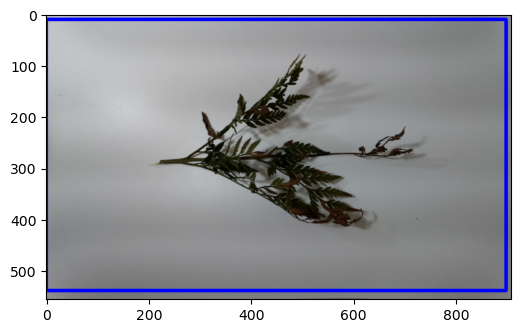

In [203]:
# Define region of interest (ROI)

# Inputs:
#    img   = An RGB or grayscale image to plot the ROI on.
#    x     = The x-coordinate of the upper left corner of the rectangle.
#    y     = The y-coordinate of the upper left corner of the rectangle.
#    h     = The width of the rectangle.
#    w     = The height of the rectangle.
#   roi_contour, roi_hierarchy = pcv.roi.rectangle(5, 90, 200, 390, img1) 
#                                                  |______________|
#                                            adjust these four values
roi_contour, roi_hierarchy = pcv.roi.rectangle(img=cropped, x=0, y=10, h=530, w=900) #CHANGE TO %of w&height

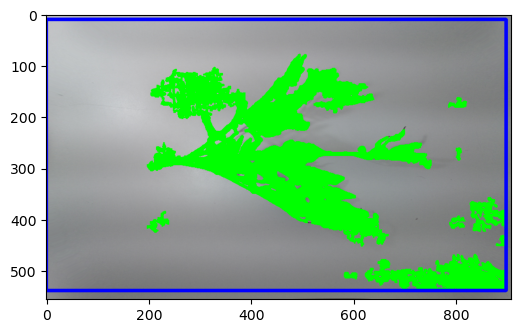

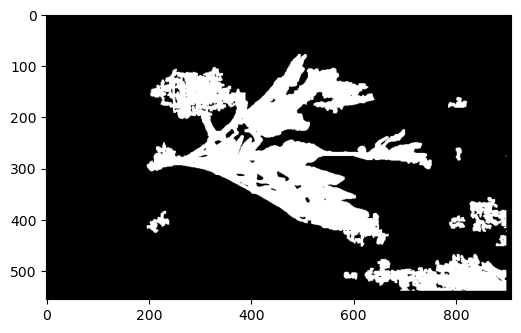

In [204]:
# Keep objects that overlap with the ROI

# Inputs:
#    img            = img to display kept objects
#    roi_contour    = contour of roi, output from any ROI function
#    roi_hierarchy  = contour of roi, output from any ROI function
#    object_contour = contours of objects, output from pcv.find_objects function
#    obj_hierarchy  = hierarchy of objects, output from pcv.find_objects function
#    roi_type       = 'partial' (default, for partially inside the ROI), 'cutto', or 
#                     'largest' (keep only largest contour)

roi_objects, roi_obj_hierarchy, kept_mask, obj_area = pcv.roi_objects(img=cropped, roi_contour=roi_contour, 
                                                                      roi_hierarchy=roi_hierarchy,
                                                                      object_contour=id_objects, 
                                                                      obj_hierarchy=obj_hierarchy, 
                                                                      roi_type='cutto')

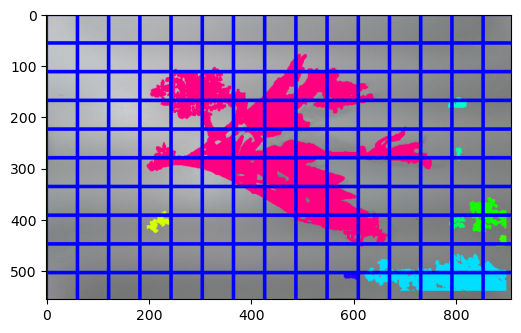

In [205]:
# This function take a image with multiple contours and
# clusters them based on user input of rows and columns

# Inputs:
#    img               = An RGB or grayscale image
#    roi_objects       = object contours in an image that are needed to be clustered.
#    roi_obj_hierarchy = object hierarchy
#    nrow              = number of rows to cluster (this should be the approximate  number of 
#                        desired rows in the entire image even if there isn't a literal row of plants)
#    ncol              = number of columns to cluster (this should be the approximate number of 
#                        desired columns in the entire image even if there isn't a literal row of plants)
#    show_grid         = if True then the grid is drawn on the image, default show_grid=False
clusters_i, contours, hierarchies = pcv.cluster_contours(img=cropped, roi_objects=roi_objects, 
                                                         roi_obj_hierarchy=roi_obj_hierarchy, 
                                                         nrow=10, ncol=15, 
                                                         show_grid=True)


In [206]:
# # Inputs:
# # mask             = Mask/binary image to segment into clusters.
# # algorithm        = Algorithm to use for segregating different clusters.
# #                    Currently supporting OPTICS and DBSCAN. (Default="DBSCAN")
# # min_cluster_size = The minimum size a section of a mask must be (in pixels)
# #                    before it can be considered its own cluster. (Default=5)
# # max_distance     = The total distance between two pixels for them to be considered a part
# #                    of the same cluster.  For the DBSCAN algorithm, value must be between
# #                    0 and 1.  For OPTICS, the value is in pixels and depends on the size
# #                    of your picture.  (Default=0)
# clust_img, clust_masks = pcv.spatial_clustering(mask=kept_mask, algorithm="DBSCAN", min_cluster_size=5, max_distance=None)



In [207]:
# # Set the sequence of colors from the color_scale created by the 
# # color_palette function to "sequential" or "random" order. 
# # Default = "sequential". 
# pcv.params.color_sequence = 'random'
# cluster_img = pcv.visualize.clustered_contours(img=img, grouped_contour_indices=clusters_i, 
#                                                 roi_objects=contours,
#                                                 roi_obj_hierarchy=hierarchies)

In [208]:
crop_img_arrRGB = []
img_rect = cropped.copy()
height, width, channels = cropped.shape

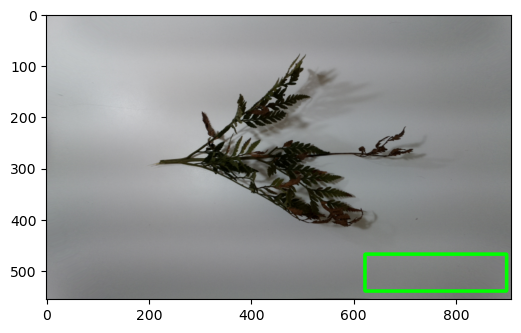

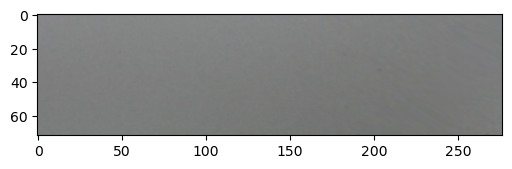

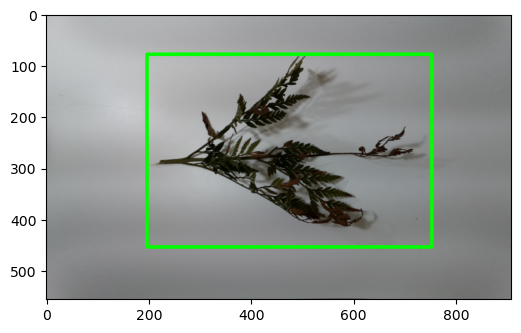

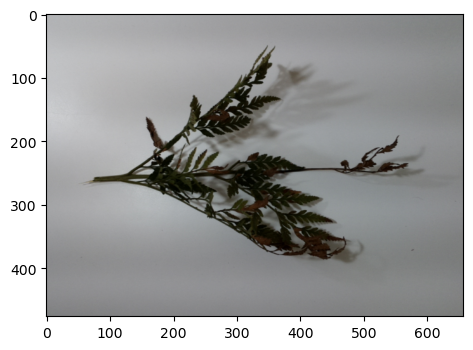

In [209]:
for i in range(len(contours)):
    if hierarchies[0][i][3] == -1:
        x,y,w,h = cv2.boundingRect(contours[i])
        cv2.rectangle(img_rect,(x,y),(x+w,y+h),(0,255,0),2)
        
        if h >= 0.08*height and w >= 0.08*width:
            crop_img = pcv.auto_crop(img=cropped, obj=contours[i], padding_x=50, padding_y=50, color='image')
            crop_img_arrRGB.append(crop_img)

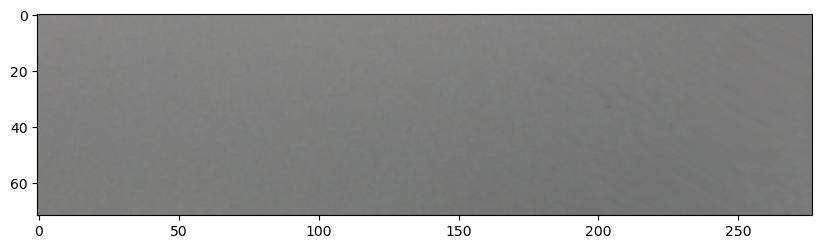

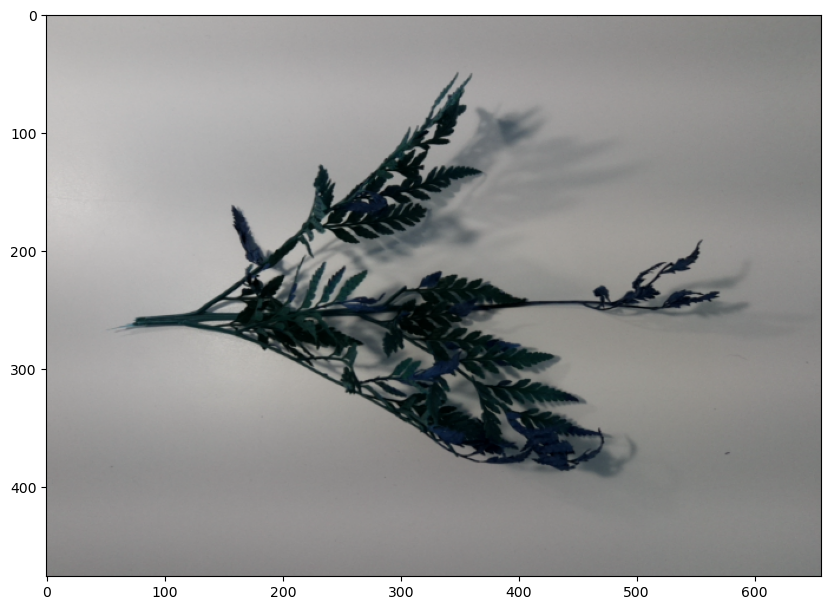

In [210]:
for i in range(len(crop_img_arrRGB)):
    display(crop_img_arrRGB[i])


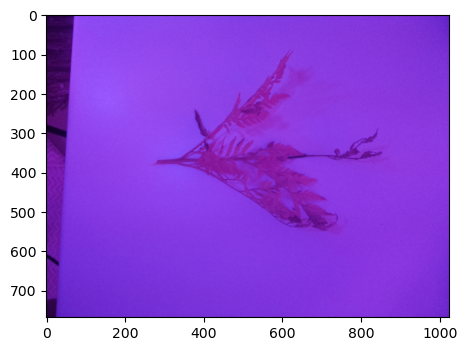

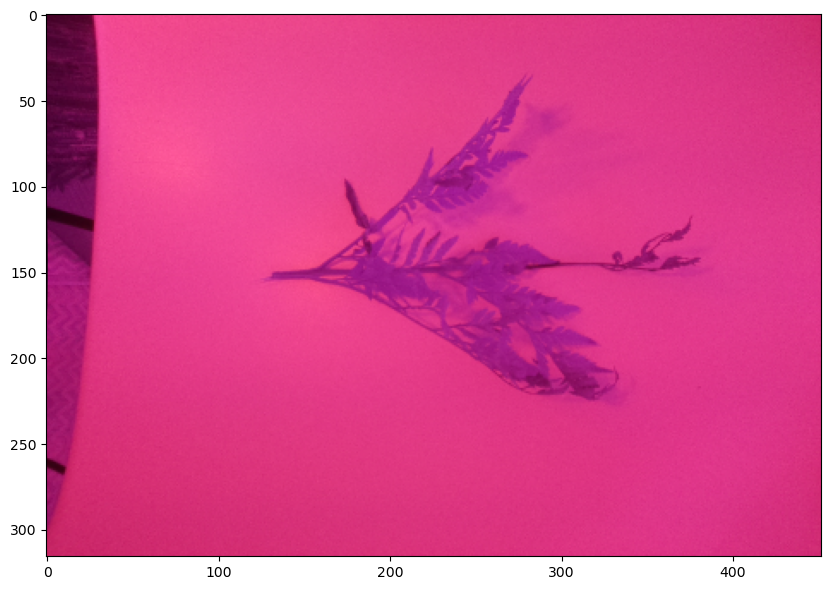

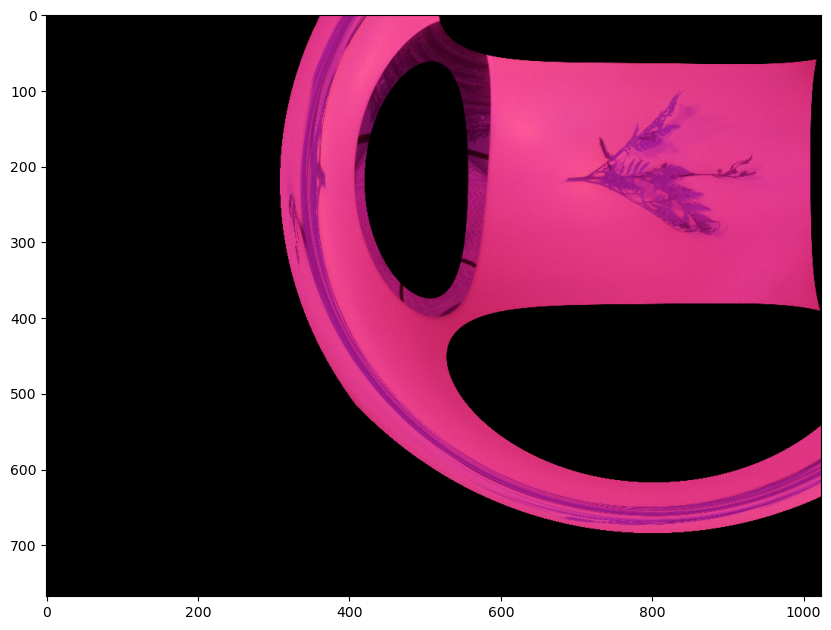

In [228]:
# Read image 

# Inputs:
#   filename - Image file to be read in 
#   mode - Return mode of image; either 'native' (default), 'rgb', 'gray', or 'csv' 
img, path, filename = pcv.readimage(filename="/Users/garethtate/plantcv/TestImagesRPi/Still-1-RGBN-2021-07-09_12-15-51.jpg")

camera_matrix = np.loadtxt("/Users/garethtate/Downloads/rgbn_cam/cameraMatrix.txt", dtype='float', delimiter=',')
distortion_coefficients = np.loadtxt("/Users/garethtate/Downloads/rgbn_cam/cameraDistortion.txt", dtype='float', delimiter=',')

Ncropped, Nundis, Ndis = undistort(img, camera_matrix, distortion_coefficients)

display(Ncropped)
display(Nundis)

In [212]:
# All the 6 methods for comparison in a list
# Note how we are using strings, later on we'll use the eval() function to convert to function
methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR','cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']

In [213]:
crop_img_arrNIR = []

*****************************************************************


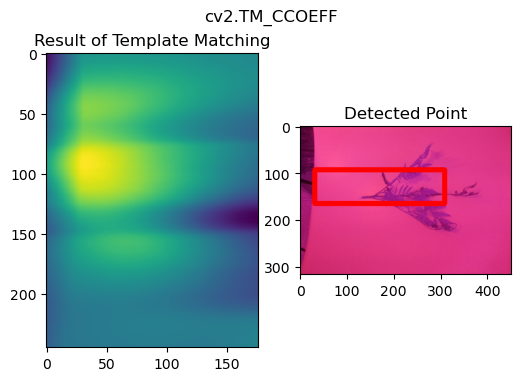

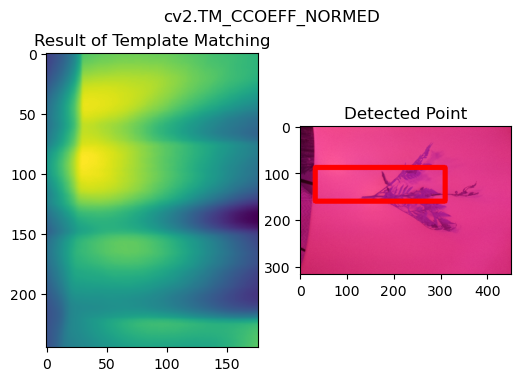

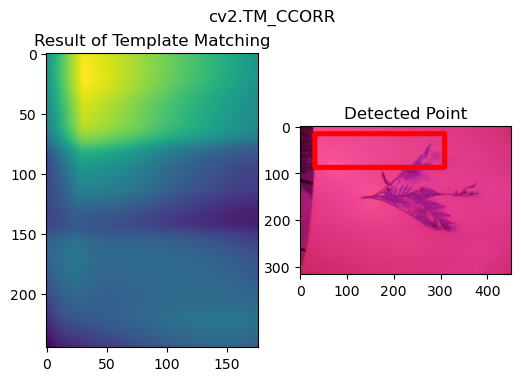

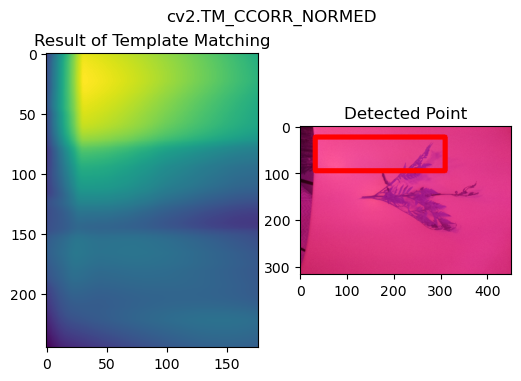

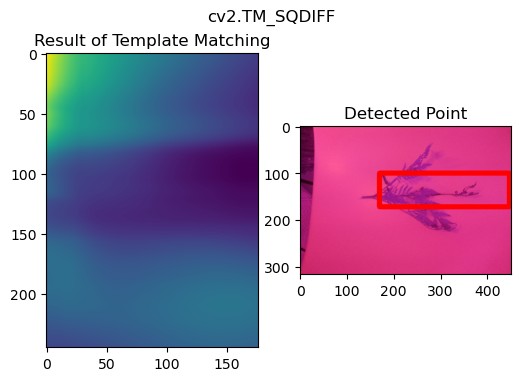

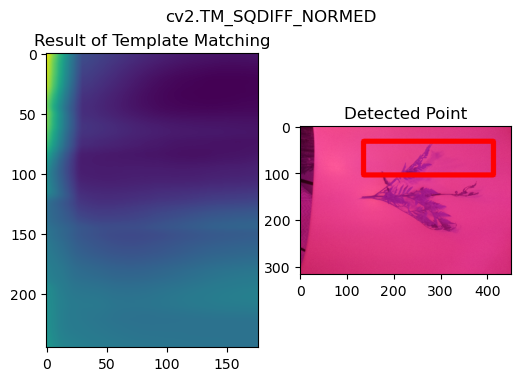

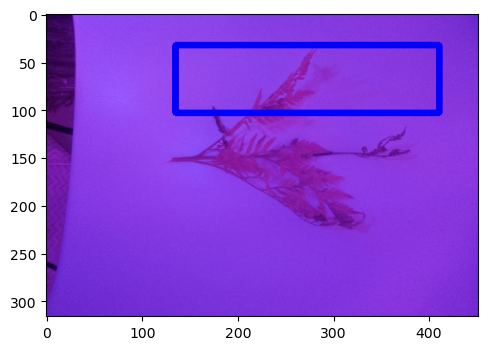

*****************************************************************


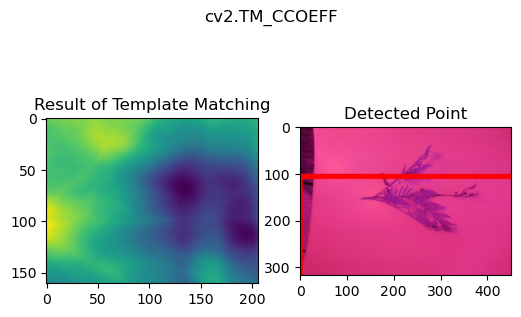

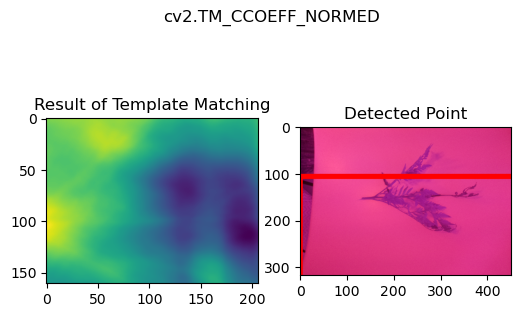

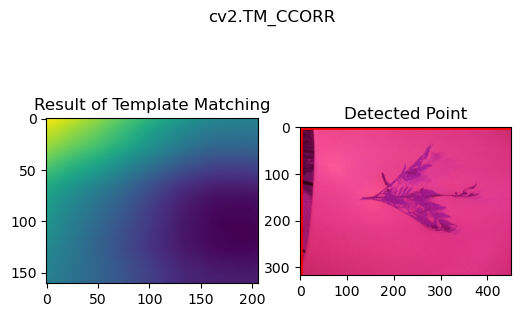

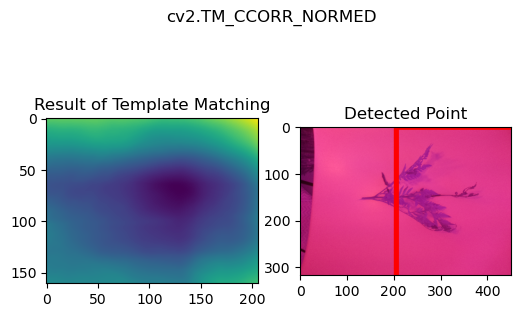

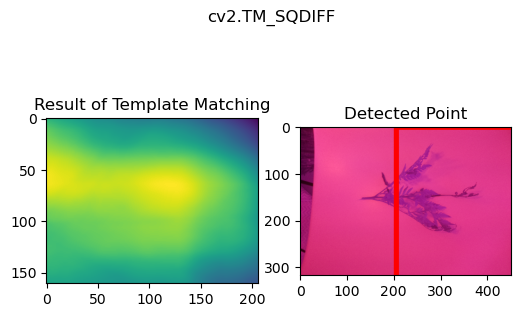

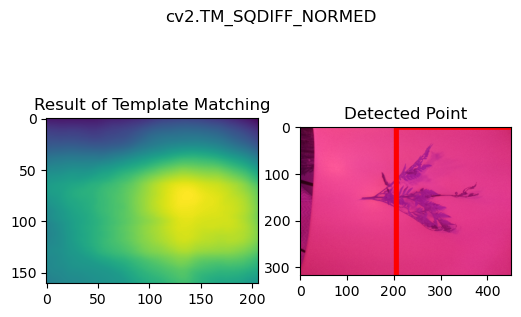

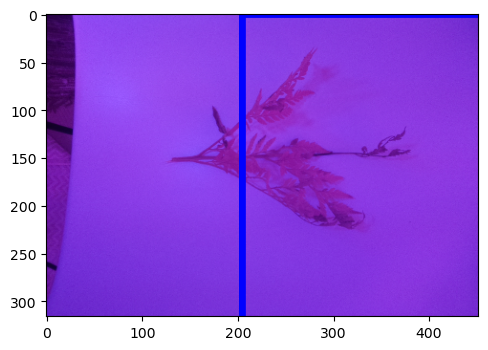

In [214]:
for k in range(len(crop_img_arrRGB)):
    print('*****************************************************************')
    crop_h, crop_w, crop_chan =  crop_img_arrRGB[k].shape

    for m in methods:
    
        # Create a copy of the image
        full_copy = Ncropped.copy()
    
        # Get the actual function instead of the string
        method = eval(m)

        # Apply template Matching with the method
        res = cv2.matchTemplate(full_copy,crop_img_arrRGB[k],method)
    
        # Grab the Max and Min values, plus their locations
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    
        # Set up drawing of Rectangle
    
        # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
        # Notice the coloring on the last 2 left hand side images.
        if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
            top_left = min_loc    
        else:
            top_left = max_loc
        
        # Assign the Bottom Right of the rectangle (assuming images have same w & h)
        bottom_right = (top_left[0] + crop_w, top_left[1] + crop_h)
        
        
        # Draw the Red Rectangle
        cv2.rectangle(full_copy,top_left, bottom_right, 255, 10)

        # Plot the Images
        plt.subplot(121)
        plt.imshow(res)
        plt.title('Result of Template Matching')
    
        plt.subplot(122)
        plt.imshow(full_copy)
        plt.title('Detected Point')
        plt.suptitle(m)
    
    
        plt.show()
        print('\n')
        print('\n')
        
    # Crop image
    crop_imgNIR = pcv.crop(img=Ncropped, x=top_left[0], y=top_left[1], h=crop_h, w=crop_w)
    crop_img_arrNIR.append(crop_imgNIR)
    

In [215]:
#Overlap and NDVI calc.
# pcv.plot_image(img[:,:,2])

In [216]:
import sys
np.set_printoptions(threshold=sys.maxsize)

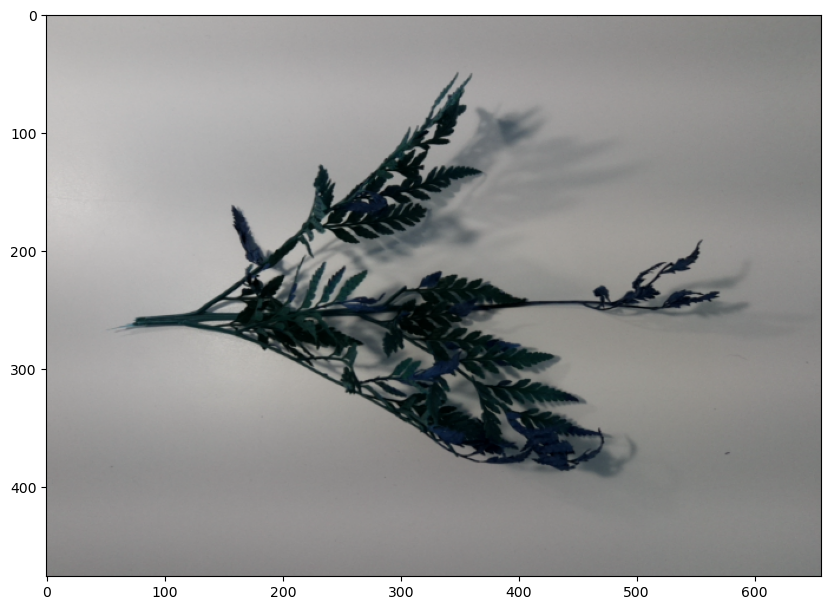

In [217]:
VISimgR = crop_img_arrRGB[i]
    
# VISimgR[:,:,1] = 0
# VISimgR[:,:,2] = 0
display(VISimgR) 

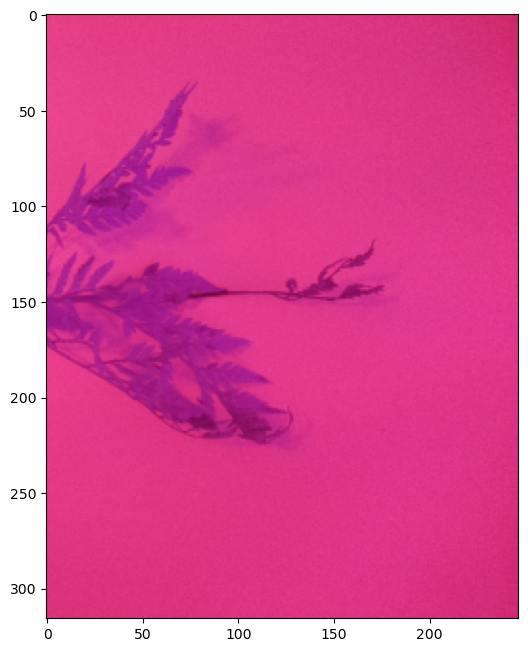

In [218]:
NIRimgNR = crop_img_arrNIR[i]
    
# NIRimgNR[:,:,1] = 0
# NIRimgNR[:,:,2] = 0 
display(NIRimgNR) 

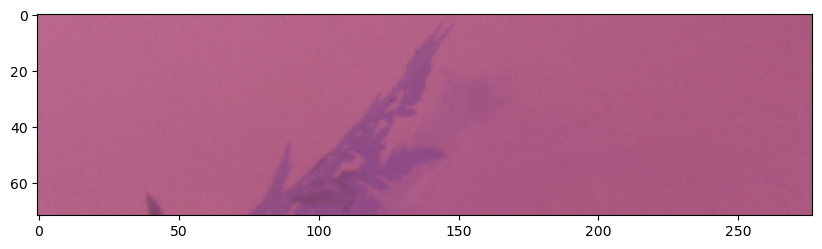

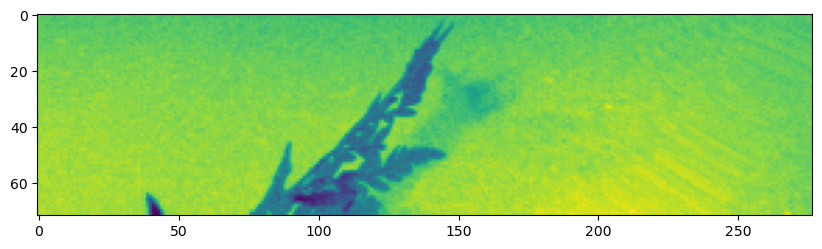

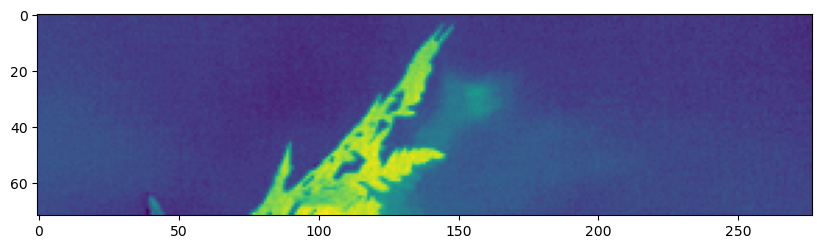

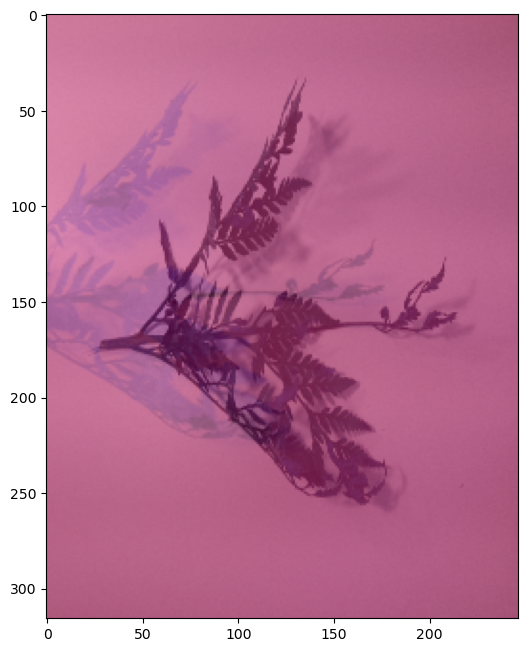

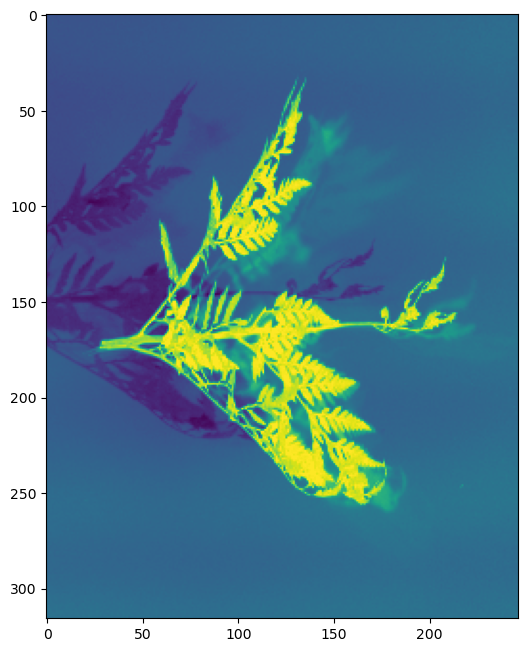

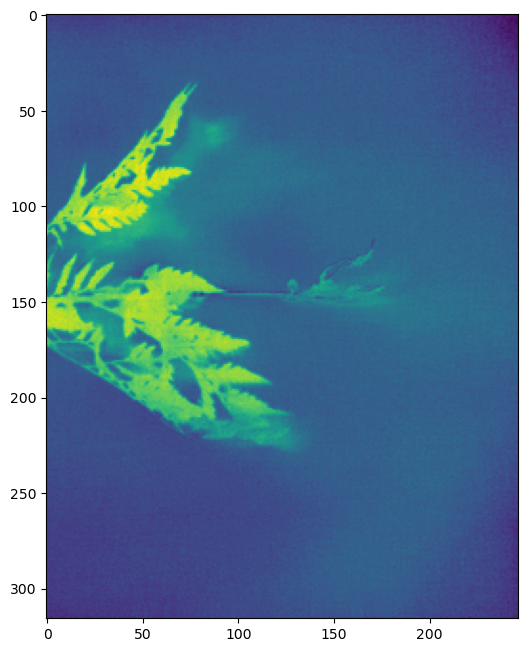

In [219]:
#do a check to make sure that the rgb and nir arr are the same length

for i in range(len(crop_img_arrRGB)):
    
    
#     display(crop_img_arrRGB[i][:,:,0])
#     display(crop_img_arrNIR[i][:,:,0])
    
    VISimg = crop_img_arrRGB[i]

    
    NIRimg = crop_img_arrNIR[i]
    
    
    

    if NIRimg.shape[0] < VISimg.shape[0]:
        #np.resize(VISimgR[:], new_shape)
        
        #VISimgR = cv2.resize(img, dsize=(54, 140), interpolation=cv2.INTER_CUBIC)
        VISimg = cv2.resize(VISimg, dsize=(VISimg.shape[1], NIRimg.shape[0]), interpolation=cv2.INTER_CUBIC)        
        # Resize image using resize function, with interpolation, and default interpolation method
        #VISimgR = pcv.transform.resize(img=VISimgR, size=(NIRimgNR.shape[0], VISimgR.shape[1]), interpolation="auto")
        
    if NIRimg.shape[0] > VISimg.shape[0]:
        
        NIRimg = cv2.resize(NIRimg, dsize=(NIRimg.shape[1], VISimg.shape[0]), interpolation=cv2.INTER_CUBIC) 
        # Resize image using resize function, with interpolation, and default interpolation method
        #NIRimgNR = pcv.transform.resize(img=NIRimgNR, size=(VISimgR.shape[0], NIRimgNR.shape[1]), interpolation="auto")
        
    if NIRimg.shape[1] < VISimg.shape[1]:
                
        VISimg = cv2.resize(VISimg, dsize=(NIRimg.shape[1],VISimg.shape[0]), interpolation=cv2.INTER_CUBIC) 
        # Resize image using resize function, with interpolation, and default interpolation method
        #VISimgR = pcv.transform.resize(img=VISimgR, size=(VISimgR.shape[0], NIRimgNR.shape[1]), interpolation="auto")
        
    if NIRimg.shape[1] > VISimg.shape[1]:
        
        NIRimg = cv2.resize(NIRimg, dsize=(VISimg.shape[1], NIRimg.shape[0]), interpolation=cv2.INTER_CUBIC)     
        # Resize image using resize function, with interpolation, and default interpolation method
        #NIRimgNR = pcv.transform.resize(img=NIRimgNR, size=(NIRimgNR.shape[0], VISimgR.shape[1]), interpolation="auto")
    
    overlay = cv2.addWeighted(src1=NIRimg,alpha=0.5,src2=VISimg,beta=0.5,gamma=0) 

    display(overlay)
    
    
    NIRimg = NIRimg.astype('float')
    VISimg = VISimg.astype('float')
    
    NIR_R = NIRimg[:,:,0] 
    NIR_G = NIRimg[:,:,1]
    NIR_B = NIRimg[:,:,2]
    
#     #NIRactual=np.clip(NIRactual,a_min=0.01, a_max=255)
    
    VIS_R = VISimg[:,:,0]
    VIS_G = VISimg[:,:,1]
    VIS_B = VISimg[:,:,2]
     
    
#     compare = np.hstack((NIRactual, VISactual))
    
    NDVI_R = (NIR_R-VIS_R)/(NIR_R+VIS_R)
    
    NDVI_B = (NIR_B-NIR_R)/(NIR_B+NIR_R)
#     NDVI[np.isnan(NDVI)] = 0.01
    #if neg
#     NDVI = (NDVI+np.abs(np.min(NDVI)))
#     NDVI = (NDVI/np.max(NDVI))*255
#     NDVI = NDVI.astype(int)
#     print(np.max(NDVI), np.min(NDVI))
    print('\n')
#     print(NDVI)
#     print(VISimgR[:,:,0])
    
    
    
    display(NDVI_R)
    display(NDVI_B)
    print('\n')
    print('\n')
    
#     print(NIRimgNR[:,:,0])  

#     def plot_examples(colormaps):
#         """
#         Helper function to plot data with associated colormap.
#         """
#         display(NDVI, cmap = 'gist_earth')
        
#         np.random.seed(19680801)
#         data = np.random.randn(30, 30)
        
#         n = len(colormaps)
#         fig, axs = plt.subplots(1, n, figsize=(n * 2 + 2, 3),
#                             constrained_layout=True, squeeze=False)
#         for [ax, cmap] in zip(axs.flat, colormaps):
#             psm = ax.pcolormesh(NDVI, cmap=cmap, rasterized=True, vmin=-1, vmax=1)
#             fig.colorbar(psm, ax=ax)
#         plt.show()

    #cmap = ListedColormap(["darkorange", "gold", "lawngreen", "lightseagreen"])
#     plot_examples([cmap])

   
    


In [220]:
min_vN, max_vN, min_ptN, max_ptN = cv2.minMaxLoc(NIR_R)

print(min_vN, max_vN, min_ptN, max_ptN)

111.0 238.0 (87, 146) (0, 43)


In [221]:
min_vV, max_vV, min_ptV, max_ptV = cv2.minMaxLoc(VIS_R)

print(min_vV, max_vV, min_ptV, max_ptV)

0.0 211.0 (127, 54) (4, 106)


In [222]:
VIS_R[115, 80]

176.0

In [223]:
NIR_R[115, 80]

226.0

In [224]:
NIR_B[115, 80]

146.0

In [225]:
NDVI_R[115, 80]

0.12437810945273632

In [226]:
NDVI_B[115, 80]

-0.21505376344086022

In [227]:
# 